<center> <h1>Stochastic Gradient Descent and Average Gradient in a FeedForward Neural Network</h1> </center>
<p style="text-align: center;">IFT 6512 - Programmation stochastique - Final Project</p>
<p style="text-align: center;">EL FATTAHI Charaf-Ed-Dine</p>

This homework solution has been inspired from [IFT 6390](https://admission.umontreal.ca/cours-et-horaires/cours/ift-6390/) homeworks as well as the work of [Francois David](https://www.zspapapa.com/francoisdavid) and [hackernoon](https://hackernoon.com/building-a-feedforward-neural-network-from-scratch-in-python-d3526457156b).

**IMPORTANT**

* The detailed disscussion can be found in the [.pdf](https://github.com/devCharaf/IFT-6512---Project) file submitted with the project.

# Imports

In [1]:
import scipy
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors
import timeit

from tqdm.notebook import tqdm
from random import randint

# sklearn
from sklearn.preprocessing import OneHotEncoder, OrdinalEncoder
from sklearn.datasets import make_blobs
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, mean_squared_error

# plotly
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

# IRIS data
In this section we use the [IRIS](https://scikit-learn.org/stable/auto_examples/datasets/plot_iris_dataset.html) dataset also availible in [UCI Machine Learning Repository](http://archive.ics.uci.edu/ml/index.php).
This data set contains 150 rows with 4 **features** (the length and the width of the [sepals](https://en.wikipedia.org/wiki/Sepal) and [petals](https://en.wikipedia.org/wiki/Petal) in cm). The **target** has 3 possible values (```'setosa'```, ```'versicolor'```, ```'virginica'```).

In [2]:
iris = datasets.load_iris()
data = iris.data
labels = iris.target
starting_labels = labels

We split our dataset into training and validation data using [```sklearn.model_selection.train_test_split()```](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html). We also encode our target as it is a categorical varible through [```sklearn.preprocessing.OneHotEncoder()```](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html). This will encode ```'setosa'``` into ```(1, 0, 0)```, ```'versicolor'``` into ```(0, 1, 0)```, and so on.

In [3]:
X_train, X_val, Y_train, Y_val = train_test_split(data, starting_labels, stratify=starting_labels, random_state=0)
print(X_train.shape, X_val.shape)

#one hot encoder
enc = OneHotEncoder()
# 'setosa' -> (1, 0, 0), 'versicolor' -> (0, 1, 0), 'virginica' -> (0, 0, 1)
y_OH_train = enc.fit_transform(np.expand_dims(Y_train,1)).toarray()
y_OH_val = enc.fit_transform(np.expand_dims(Y_val,1)).toarray()
print(y_OH_train.shape, y_OH_val.shape)

(112, 4) (38, 4)
(112, 3) (38, 3)


# Feedforward Neural Network
In this section we build our Feedforward Neural Network from scratch with an aribitrary number of hidden layers as well as neurons for multi-class data. This will help us test this FFNN with other data later on. This section has been inspired from [hackernoon](https://hackernoon.com/building-a-feedforward-neural-network-from-scratch-in-python-d3526457156b).
In this section we fit our model using the usual gradient descent method.

In [4]:
class FFSN_MultiClass:
  
    def __init__(self, n_inputs, n_outputs, hidden_sizes=[3]):
        self.nx = n_inputs
        self.ny = n_outputs
        self.nh = len(hidden_sizes)
        self.sizes = [self.nx] + hidden_sizes + [self.ny] 

        self.W = {}
        self.B = {}
        for i in range(self.nh+1):
            self.W[i+1] = np.random.randn(self.sizes[i], self.sizes[i+1])
            self.B[i+1] = np.zeros((1, self.sizes[i+1]))

    def sigmoid(self, x):
        return scipy.special.expit(x)
        # return 1.0/(1.0 + np.exp(-x))

    def softmax(self, x):
        exps = np.exp(x)
        return exps / np.sum(exps)

    def forward_pass(self, x):
        self.A = {}
        self.H = {}
        self.H[0] = x.reshape(1, -1)
        for i in range(self.nh):
            self.A[i+1] = np.matmul(self.H[i], self.W[i+1]) + self.B[i+1]
            self.H[i+1] = self.sigmoid(self.A[i+1])
        self.A[self.nh+1] = np.matmul(self.H[self.nh], self.W[self.nh+1]) + self.B[self.nh+1]
        self.H[self.nh+1] = self.softmax(self.A[self.nh+1])
        return self.H[self.nh+1]

    def predict(self, X):
        Y_pred = []
        for x in X:
            y_pred = self.forward_pass(x)
            Y_pred.append(y_pred)
        return np.array(Y_pred).squeeze()

    def grad_sigmoid(self, x):
        return x*(1-x)

    def cross_entropy(self, label, pred):
        yl=np.multiply(pred,label)
        yl=yl[yl!=0]
        yl=-np.log(yl)
        yl=np.mean(yl)
        return yl

    def grad(self, x, y):
        self.forward_pass(x)
        self.dW = {}
        self.dB = {}
        self.dH = {}
        self.dA = {}
        L = self.nh + 1
        self.dA[L] = (self.H[L] - y)
        for k in range(L, 0, -1):
            self.dW[k] = np.matmul(self.H[k-1].T, self.dA[k])
            self.dB[k] = self.dA[k]
            self.dH[k-1] = np.matmul(self.dA[k], self.W[k].T)
            self.dA[k-1] = np.multiply(self.dH[k-1], self.grad_sigmoid(self.H[k-1])) 
    
    def compute_average_loss_and_accuracy(self, X, y):
        predictions = self.predict(X)
        accuracy = np.mean(np.argmax(y, 1) == np.argmax(self.predict(X), 1))
        loss = self.cross_entropy(y, predictions)
        return loss, accuracy, predictions


    def fit(self, X_train, Y_train, X_val, Y_val, epochs=100, initialize='True', learning_rate=0.01, display=False):
        train_logs = {'train_accuracy': [], 'validation_accuracy': [], 'train_loss': [], 'validation_loss': [], 'time': []}
        ep = np.arange(epochs)
        if display:
            loss = {}
            accuracy = {}

        if initialize:
            for i in range(self.nh+1):
                self.W[i+1] = np.random.randn(self.sizes[i], self.sizes[i+1])
                self.B[i+1] = np.zeros((1, self.sizes[i+1]))
        
        ss = timeit.default_timer()
        for epoch in tqdm(range(epochs), total=epochs, unit="epoch"):
            
            if (epoch+1)%1000 == 1:
                start = timeit.default_timer()
            
            dW = {}
            dB = {}
            for i in range(self.nh+1):
                dW[i+1] = np.zeros((self.sizes[i], self.sizes[i+1]))
                dB[i+1] = np.zeros((1, self.sizes[i+1]))
            for x, y in zip(X_train, Y_train):
                self.grad(x, y)
                for i in range(self.nh+1):
                    dW[i+1] += self.dW[i+1]
                    dB[i+1] += self.dB[i+1]

            m = X_train.shape[1]
            for i in range(self.nh+1):
                self.W[i+1] -= learning_rate * (dW[i+1]/m)
                self.B[i+1] -= learning_rate * (dB[i+1]/m)

            if display:
                Y_pred = self.predict(X_train) 
                loss[epoch] = self.cross_entropy(Y_train, Y_pred)
                accuracy[epoch]= np.mean(np.argmax(Y_train, 1) == np.argmax(Y_pred, 1))
        
            train_loss, train_accuracy, _ = self.compute_average_loss_and_accuracy(X_train, Y_train)
            valid_loss, valid_accuracy, _ = self.compute_average_loss_and_accuracy(X_val, Y_val)
            
            if (epoch+1)%1000 == 0:
                stop = timeit.default_timer()
                print(f"Iteration: {epoch}, Train Accuracy: {train_accuracy}, \tValid  Accuracy: {valid_accuracy},\t Train Loss: {train_loss}, \tValid Loss:  {valid_loss} , Time: {round(stop - start, 2)}")

            train_logs['train_accuracy'].append(train_accuracy)
            train_logs['validation_accuracy'].append(valid_accuracy)
            train_logs['train_loss'].append(train_loss)
            train_logs['validation_loss'].append(valid_loss)
        
        tt = timeit.default_timer()
        print(f"training time: {round(tt-ss, 2)}")
        if display:
            fig = make_subplots(rows=2, cols=2)

            fig.add_trace(
                go.Scatter(name="train_loss", x=ep, y=train_logs['train_loss']),
                row=1, col=1
            )
            fig['layout']['xaxis'].update(title_text='epochs')
            fig['layout']['yaxis'].update(title_text='CEL')

            fig.add_trace(
                go.Scatter(name="train_accuracy", x=ep, y=train_logs['train_accuracy']),
                row=1, col=2
            )
            fig['layout']['xaxis2'].update(title_text='epochs')
            fig['layout']['yaxis2'].update(title_text='accuracy')
            
            fig.add_trace(
                go.Scatter(name="train_loss", x=ep, y=train_logs['validation_loss']),
                row=2, col=1
            )
            fig['layout']['xaxis3'].update(title_text='epochs')
            fig['layout']['yaxis3'].update(title_text='CEL')

            fig.add_trace(
                go.Scatter(name="train_accuracy", x=ep, y=train_logs['validation_accuracy']),
                row=2, col=2
            )
            fig['layout']['xaxis4'].update(title_text='epochs')
            fig['layout']['yaxis4'].update(title_text='accuracy')
            
            fig.layout.update(height=600, width=800, title_text="Convergence of the loss and accuracy")
            fig.show()

  0%|          | 0/10000 [00:00<?, ?epoch/s]

Iteration: 999, Train Accuracy: 0.7232142857142857, 	Valid  Accuracy: 0.7105263157894737,	 Train Loss: 0.5315933627390506, 	Valid Loss:  0.5251290875047329 , Time: 15.76
Iteration: 1999, Train Accuracy: 0.8392857142857143, 	Valid  Accuracy: 0.868421052631579,	 Train Loss: 0.37131023752427417, 	Valid Loss:  0.34024340807899256 , Time: 17.14
Iteration: 2999, Train Accuracy: 0.9553571428571429, 	Valid  Accuracy: 0.9736842105263158,	 Train Loss: 0.1718447694916748, 	Valid Loss:  0.15210925124918787 , Time: 16.3
Iteration: 3999, Train Accuracy: 0.9732142857142857, 	Valid  Accuracy: 0.9736842105263158,	 Train Loss: 0.10520079139344295, 	Valid Loss:  0.08851683968827943 , Time: 16.25
Iteration: 4999, Train Accuracy: 0.9821428571428571, 	Valid  Accuracy: 0.9736842105263158,	 Train Loss: 0.08618089474180161, 	Valid Loss:  0.06626071288649966 , Time: 16.32
Iteration: 5999, Train Accuracy: 0.9821428571428571, 	Valid  Accuracy: 0.9736842105263158,	 Train Loss: 0.08291566047689224, 	Valid Loss:  0.

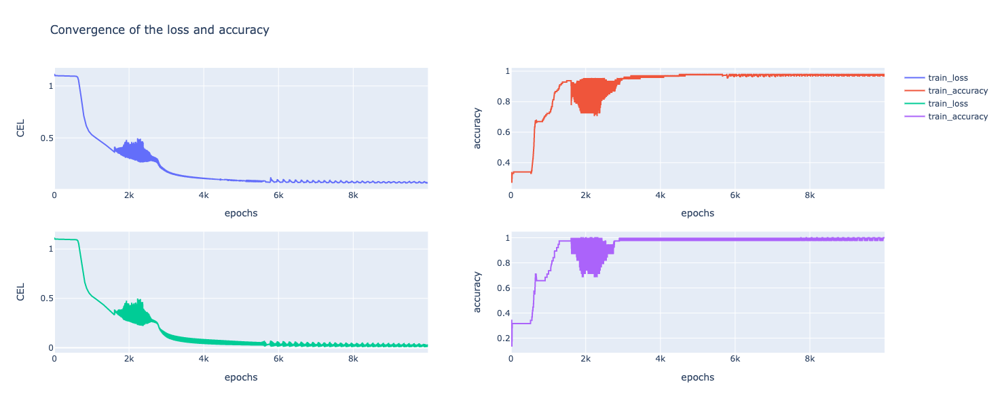

In [5]:
# train the network
ffsn_multi = FFSN_MultiClass(4, 3, [3,3])
ffsn_multi.fit(X_train, y_OH_train, X_val, y_OH_val, epochs=10000, learning_rate=.005, display=True)

In [6]:
Y_pred_train = ffsn_multi.predict(X_train)
Y_pred_train = np.argmax(Y_pred_train,1)

Y_pred_val = ffsn_multi.predict(X_val)
Y_pred_val = np.argmax(Y_pred_val,1)

We use the following to visualize the oredicted data. The size of the scattered data is given by ```15*(np.abs(np.sign(Y_pred_train-Y_train))+.1)```. When the original label is equal to the predicted value, then the size ```size = 3```. Otherwise ```size = 18```.

In [7]:
my_cmap = matplotlib.colors.LinearSegmentedColormap.from_list("", ["red","blue","green"])

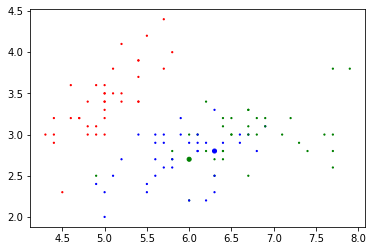

In [8]:
# visualize
plt.scatter(X_train[:,0], X_train[:,1], c=Y_pred_train, cmap=my_cmap, s=15*(np.abs(np.sign(Y_pred_train-Y_train))+.1))
plt.show()

# Stochastic Gradient Descent
In this section we implement the stochastic gradient descent for our Feedforward Neural network.

In [ ]:
starting_labels = labels
X_train, X_val, Y_train, Y_val = train_test_split(data, starting_labels, stratify=starting_labels, random_state=0)
print(X_train.shape, X_val.shape)

#one hot encoder
enc = OneHotEncoder()
# 'setosa' -> (1, 0, 0), 'versicolor' -> (0, 1, 0), 'virginica' -> (0, 0, 1)
y_OH_train = enc.fit_transform(np.expand_dims(Y_train,1)).toarray()
y_OH_val = enc.fit_transform(np.expand_dims(Y_val,1)).toarray()
print(y_OH_train.shape, y_OH_val.shape)

In [9]:
def fit_SG(ffsn_multi, X_train, Y_train, X_val, Y_val, epochs, initialize=True, display=False):
    train_logs = {'train_accuracy': [], 'validation_accuracy': [], 'train_loss': [], 'validation_loss': [], 'time': []}
    
    ep = np.arange(epochs)
    
    X_train = X_train
    y_train = Y_train
    y_onehot = Y_train
    
    X_valid = X_val
    y_valid = Y_val
    
    dims = [X_train.shape[1], y_onehot.shape[1]]
    hidden_dims = np.array(ffsn_multi.sizes) - np.array([ffsn_multi.nx]) - np.array([ffsn_multi.ny])
    
    dW = {}
    dB = {}
    
    if initialize:
        for i in range(ffsn_multi.nh+1):
            ffsn_multi.W[i+1] = np.random.randn(ffsn_multi.sizes[i], ffsn_multi.sizes[i+1])
            ffsn_multi.B[i+1] = np.zeros((1, ffsn_multi.sizes[i+1]))

    batch_size = 1
    alpha = 5e-2
    n_batches = 100
    previousLoss = 2147483647
    
    ss = timeit.default_timer()
    for epoch in tqdm(range(epochs), total=epochs, unit="epoch"):
        if (epoch+1)%1000 == 1:
            start = timeit.default_timer()
        
        # random index for gradient descent
        randIndex = randint(0, n_batches)
        minibatchX = X_train[batch_size * randIndex:batch_size * (randIndex + 1), :]
        minibatchY = y_onehot[batch_size * randIndex:batch_size * (randIndex + 1), :]
        
        dW = {}
        dB = {}
        for i in range(ffsn_multi.nh+1):
            dW[i+1] = np.zeros((ffsn_multi.sizes[i], ffsn_multi.sizes[i+1]))
            dB[i+1] = np.zeros((1, ffsn_multi.sizes[i+1]))
        for x, y in zip(minibatchX, minibatchY):
            ffsn_multi.grad(x, y)
            for i in range(ffsn_multi.nh+1):
                dW[i+1] += ffsn_multi.dW[i+1]
                dB[i+1] += ffsn_multi.dB[i+1]

        m = 1
        for i in range(ffsn_multi.nh+1):
            ffsn_multi.W[i+1] -= alpha * (dW[i+1]/m)
            ffsn_multi.B[i+1] -= alpha * (dB[i+1]/m)
        
        train_loss, train_accuracy, _ = ffsn_multi.compute_average_loss_and_accuracy(X_train, y_train)
        valid_loss, valid_accuracy, _ = ffsn_multi.compute_average_loss_and_accuracy(X_valid, y_valid)
        
        if (epoch+1)%1000 == 0:
            stop = timeit.default_timer()

            # print loss and precision
            print(f"Epoch: {epoch}, Train Accuracy: {train_accuracy}, \tValid  Accuracy: {valid_accuracy}, \tTrain Loss: {train_loss}, \tValid Loss:  {valid_loss}, \tTime for 1000 Epochs: {round(stop - start, 2)}")
            
        # Adjust learning rate
        if train_loss > previousLoss:
            alpha  = alpha  *  .99999998
        previousLoss = train_loss
        
        train_logs['train_accuracy'].append(train_accuracy)
        train_logs['validation_accuracy'].append(valid_accuracy)
        train_logs['train_loss'].append(train_loss)
        train_logs['validation_loss'].append(valid_loss)
    
    tt = timeit.default_timer()
    print(f"training time: {round(tt-ss, 2)}")
    if display:
        fig = make_subplots(rows=2, cols=2)

        fig.add_trace(
            go.Scatter(name="train_loss", x=ep, y=train_logs['train_loss']),
            row=1, col=1
        )
        fig['layout']['xaxis'].update(title_text='epochs')
        fig['layout']['yaxis'].update(title_text='CEL')

        fig.add_trace(
            go.Scatter(name="train_accuracy", x=ep, y=train_logs['train_accuracy']),
            row=1, col=2
        )
        fig['layout']['xaxis2'].update(title_text='epochs')
        fig['layout']['yaxis2'].update(title_text='accuracy')
        
        fig.add_trace(
            go.Scatter(name="valid_loss", x=ep, y=train_logs['validation_loss']),
            row=2, col=1
        )
        fig['layout']['xaxis3'].update(title_text='epochs')
        fig['layout']['yaxis3'].update(title_text='CEL')

        fig.add_trace(
            go.Scatter(name="valid_accuracy", x=ep, y=train_logs['validation_accuracy']),
            row=2, col=2
        )
        fig['layout']['xaxis4'].update(title_text='epochs')
        fig['layout']['yaxis4'].update(title_text='accuracy')
            
        fig.layout.update(height=600, width=800, title_text="Convergence of the loss and accuracy")
        fig.show()


  0%|          | 0/10000 [00:00<?, ?epoch/s]

Epoch: 999, Train Accuracy: 0.6339285714285714, 	Valid  Accuracy: 0.6842105263157895, 	Train Loss: 0.639033185348525, 	Valid Loss:  0.6314255501823337, 	Time for 1000 Epochs: 8.8
Epoch: 1999, Train Accuracy: 0.6607142857142857, 	Valid  Accuracy: 0.6842105263157895, 	Train Loss: 0.509517703678056, 	Valid Loss:  0.49748025409162816, 	Time for 1000 Epochs: 7.62
Epoch: 2999, Train Accuracy: 0.6607142857142857, 	Valid  Accuracy: 0.6842105263157895, 	Train Loss: 0.48444725979750364, 	Valid Loss:  0.4757248663370273, 	Time for 1000 Epochs: 7.09
Epoch: 3999, Train Accuracy: 0.6696428571428571, 	Valid  Accuracy: 0.6578947368421053, 	Train Loss: 0.4972188108799318, 	Valid Loss:  0.4986461095395885, 	Time for 1000 Epochs: 6.89
Epoch: 4999, Train Accuracy: 0.7053571428571429, 	Valid  Accuracy: 0.6842105263157895, 	Train Loss: 0.46780509581831226, 	Valid Loss:  0.46244544393624115, 	Time for 1000 Epochs: 7.03
Epoch: 5999, Train Accuracy: 0.6607142857142857, 	Valid  Accuracy: 0.6842105263157895, 	Tr

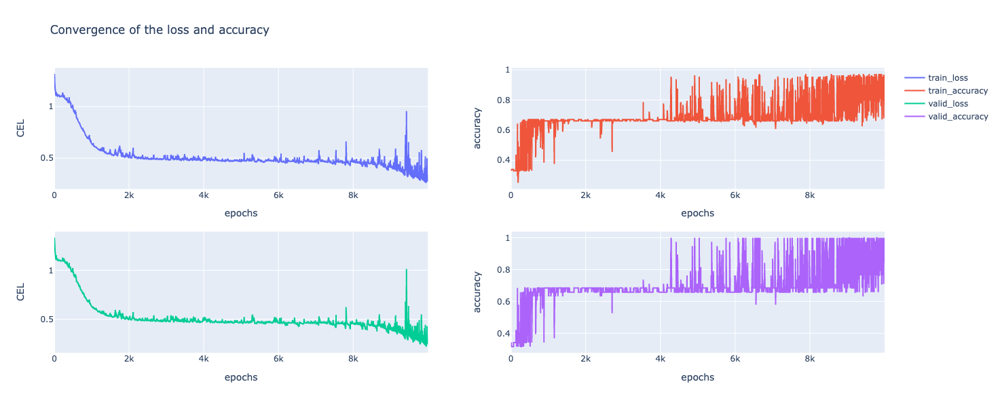

done


In [10]:
ffsn_multi = FFSN_MultiClass(4, 3, [3,3])
fit_SG(ffsn_multi, X_train, y_OH_train, X_val, y_OH_val, 10000, display=True)
print("done")

#### Visualisation

In [11]:
Y_pred_train = ffsn_multi.predict(X_train)
Y_pred_train = np.argmax(Y_pred_train,1)

Y_pred_val = ffsn_multi.predict(X_val)
Y_pred_val = np.argmax(Y_pred_val,1)

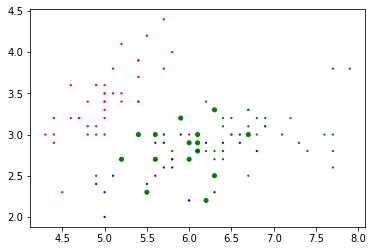

In [12]:
plt.scatter(X_train[:,0], X_train[:,1], c=Y_pred_train, cmap=my_cmap, s=15*(np.abs(np.sign(Y_pred_train-Y_train))+.1))
plt.show()

# Stochastic Average Gradient
One way to improve the SGD is through, the Stochastic Average Gradient. The Stochastic Average Gradient algorithm is a Stochastic Gradient method that keeps in track of the previously computed gradients. The new gradient of the current iteration is an average over all previous gradientsThe Stochastic Average Gradient algorithm is a Stochastic Gradient method that keeps in track of the previously computed gradients. The new gradient of the current iteration is an average over all previous gradients.

In [ ]:
starting_labels = labels
X_train, X_val, Y_train, Y_val = train_test_split(data, starting_labels, stratify=starting_labels, random_state=0)
print(X_train.shape, X_val.shape)

#one hot encoder
enc = OneHotEncoder()
# 'setosa' -> (1, 0, 0), 'versicolor' -> (0, 1, 0), 'virginica' -> (0, 0, 1)
y_OH_train = enc.fit_transform(np.expand_dims(Y_train,1)).toarray()
y_OH_val = enc.fit_transform(np.expand_dims(Y_val,1)).toarray()
print(y_OH_train.shape, y_OH_val.shape)

In [21]:
def fit_SAG(ffsn_multi, X_train, Y_train, X_valid, Y_valid, epochs, initialize=True, display=False):
    train_logs = {'train_accuracy': [], 'validation_accuracy': [], 'train_loss': [], 'validation_loss': [], 'time': []}
    
    ep = np.arange(epochs)
    
    y_onehot = Y_train
    
    dims = [X_train.shape[1], y_onehot.shape[1]]
    hidden_dims = np.array(ffsn_multi.sizes) - np.array([ffsn_multi.nx]) - np.array([ffsn_multi.ny])
    
    dW = {}
    dB = {}
    
    if initialize:
        for i in range(ffsn_multi.nh+1):
            ffsn_multi.W[i+1] = np.random.randn(ffsn_multi.sizes[i], ffsn_multi.sizes[i+1])
            ffsn_multi.B[i+1] = np.zeros((1, ffsn_multi.sizes[i+1]))
    
    batch_size = 1
    alpha = 7.9e-3
    n_batches = 100
    
    X_SAG = np.zeros(shape=(0,4))
    Y_SAG = np.zeros(shape=(0,3))
    storedIndex = []
    k = 0
    previousLoss = 2147483647
    
    ss = timeit.default_timer()
    for epoch in tqdm(range(epochs), total=epochs, unit="epoch"):
        if (epoch+1)%1000 == 1:
            start = timeit.default_timer()

        # random index for gradient descent
        randIndex = randint(0, n_batches)

        batchX = X_train[batch_size * randIndex:batch_size * (randIndex + 1), :]
        batchY = y_onehot[batch_size * randIndex:batch_size * (randIndex + 1), :]

        dW = {}
        dB = {}
        
        if randIndex not in storedIndex:
            k += 1
            storedIndex.append(randIndex)
            if epoch == 0:
                X_SAG = batchX
                Y_SAG = batchY
            else:
                X_SAG = np.append(X_SAG, batchX, axis=0)
                Y_SAG = np.append(Y_SAG, batchY, axis=0)
                
        for i in range(ffsn_multi.nh+1):
            dW[i+1] = np.zeros((ffsn_multi.sizes[i], ffsn_multi.sizes[i+1]))
            dB[i+1] = np.zeros((1, ffsn_multi.sizes[i+1]))
        for x, y in zip(X_SAG, Y_SAG):
            ffsn_multi.grad(x, y)
            for i in range(ffsn_multi.nh+1):
                dW[i+1] += ffsn_multi.dW[i+1]
                dB[i+1] += ffsn_multi.dB[i+1]

        m = k
        for i in range(ffsn_multi.nh+1):
            ffsn_multi.W[i+1] -= alpha * (dW[i+1]/m)
            ffsn_multi.B[i+1] -= alpha * (dB[i+1]/m)
        
        if (epoch+1)%1000 == 0:
            stop = timeit.default_timer()
        
        train_loss, train_accuracy, _ = ffsn_multi.compute_average_loss_and_accuracy(X_train, Y_train)
        valid_loss, valid_accuracy, _ = ffsn_multi.compute_average_loss_and_accuracy(X_valid, Y_valid)
        
        train_logs['train_accuracy'].append(train_accuracy)
        train_logs['validation_accuracy'].append(valid_accuracy)
        train_logs['train_loss'].append(train_loss)
        train_logs['validation_loss'].append(valid_loss)
        
        if (epoch+1)%1000 == 0:

            # print loss and precision
            print(f"Epoch {epoch} : Train Accuracy : {train_accuracy}, \tValid  Accuracy : {valid_accuracy},\t Train Loss : {train_loss}, \tValid Loss :  {valid_loss} , Time: {round(stop - start, 2)}")
            
            # Adjust learning rate
            if train_loss > previousLoss:
                alpha  = alpha  *  .99998
            previousLoss = train_loss
    
    tt = timeit.default_timer()
    print(f"training time: {round(tt-ss, 2)}")
    
    if display:
        fig = make_subplots(rows=2, cols=2)

        fig.add_trace(
            go.Scatter(name="train_loss", x=ep, y=train_logs['train_loss']),
            row=1, col=1
        )
        fig['layout']['xaxis'].update(title_text='epochs')
        fig['layout']['yaxis'].update(title_text='CEL')

        fig.add_trace(
            go.Scatter(name="train_accuracy", x=ep, y=train_logs['train_accuracy']),
            row=1, col=2
        )
        fig['layout']['xaxis2'].update(title_text='epochs')
        fig['layout']['yaxis2'].update(title_text='accuracy')
        
        fig.add_trace(
            go.Scatter(name="valid_loss", x=ep, y=train_logs['validation_loss']),
            row=2, col=1
        )
        fig['layout']['xaxis3'].update(title_text='epochs')
        fig['layout']['yaxis3'].update(title_text='CEL')

        fig.add_trace(
            go.Scatter(name="valid_accuracy", x=ep, y=train_logs['validation_accuracy']),
            row=2, col=2
        )
        fig['layout']['xaxis4'].update(title_text='epochs')
        fig['layout']['yaxis4'].update(title_text='accuracy')
            
        fig.layout.update(height=600, width=800, title_text="Convergence of the loss and accuracy")
        fig.show()
        

  0%|          | 0/10000 [00:00<?, ?epoch/s]

Epoch 999 : Train Accuracy : 0.5892857142857143, 	Valid  Accuracy : 0.631578947368421,	 Train Loss : 1.0973664999480448, 	Valid Loss :  1.0945227376605553 , Time: 12.5
Epoch 1999 : Train Accuracy : 0.5982142857142857, 	Valid  Accuracy : 0.631578947368421,	 Train Loss : 1.0920101791187962, 	Valid Loss :  1.089159481642226 , Time: 13.35
Epoch 2999 : Train Accuracy : 0.6339285714285714, 	Valid  Accuracy : 0.6578947368421053,	 Train Loss : 1.082434594651004, 	Valid Loss :  1.0794951427999362 , Time: 13.24
Epoch 3999 : Train Accuracy : 0.6428571428571429, 	Valid  Accuracy : 0.6842105263157895,	 Train Loss : 1.0611362577781487, 	Valid Loss :  1.0577780460133928 , Time: 13.15
Epoch 4999 : Train Accuracy : 0.6517857142857143, 	Valid  Accuracy : 0.6842105263157895,	 Train Loss : 1.0142735484044805, 	Valid Loss :  1.0096886218132723 , Time: 13.69
Epoch 5999 : Train Accuracy : 0.6607142857142857, 	Valid  Accuracy : 0.6842105263157895,	 Train Loss : 0.92982651671319, 	Valid Loss :  0.9231630523846

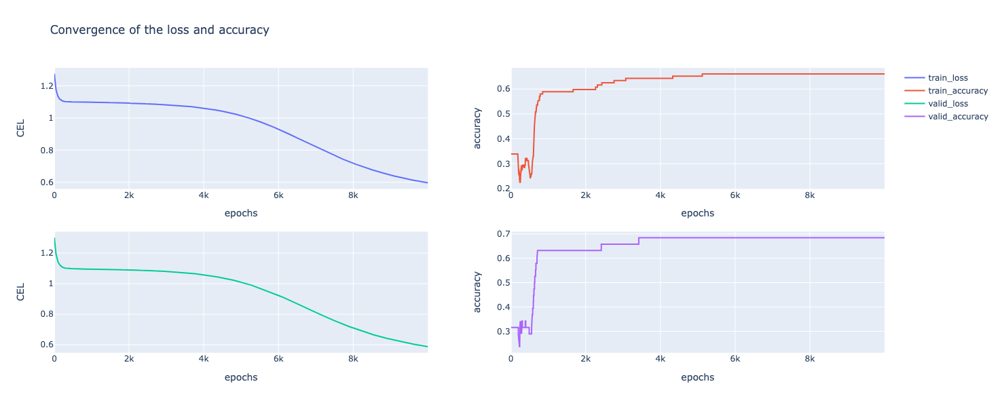

In [22]:
ffsn_multi = FFSN_MultiClass(4, 3, [3,3])
fit_SAG(ffsn_multi, X_train, y_OH_train, X_val, y_OH_val, 10000, display=True)

#### Visualisation

In [23]:
Y_pred_train = ffsn_multi.predict(X_train)
Y_pred_train = np.argmax(Y_pred_train,1)

Y_pred_val = ffsn_multi.predict(X_val)
Y_pred_val = np.argmax(Y_pred_val,1)

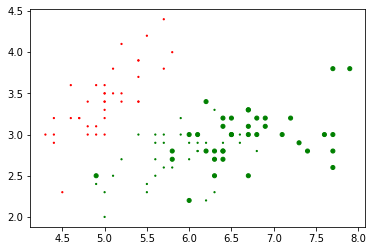

In [24]:
plt.scatter(X_train[:,0], X_train[:,1], c=Y_pred_train, cmap=my_cmap, s=15*(np.abs(np.sign(Y_pred_train-Y_train))+.1))
plt.show()